# EDA on the Kaggle "Global Wheat Detection" Competition

## Author: Junyuan Zheng

## Date: 05/24/2020

### Data source: https://www.kaggle.com/c/global-wheat-detection

# 1. Preprocessing

In [70]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
import tensorflow as tf

In [3]:
import glob # Unix style pathname pattern expansion
import os

In [4]:
train_dir = './data/train/'
test_dir = './data/test/'
train_info_path = './data/train.csv'

In [5]:
train_filenames = glob.glob(train_dir+'*') # Return a list of paths matching a pathname pattern
test_filenames = glob.glob(test_dir+'*')

### - number of training, test images

In [6]:
print ('# of training imgs:', len(train_filenames))
print ('# of test imgs:', len(test_filenames))

# of training imgs: 3422
# of test imgs: 10


- 3422 images may not be enough for training. __Data Augmentation__ is needed.

### - check the file with bounding box info

In [7]:
train_info = pd.read_csv(train_info_path)

In [8]:
train_info.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [9]:
train_info.dtypes

image_id    object
width        int64
height       int64
bbox        object
source      object
dtype: object

In [10]:
train_info.describe()

,width,height
count,147793.0,147793.0
mean,1024.0,1024.0
std,0.0,0.0
min,1024.0,1024.0
25%,1024.0,1024.0
50%,1024.0,1024.0
75%,1024.0,1024.0
max,1024.0,1024.0


- All images are in a shape of 1024*1024.

In [11]:
train_info['bbox'][0]

'[834.0, 222.0, 56.0, 36.0]'

- The 'bbox' column is in type of str.

### - map "bbox" info (xmin, ymin, weight, height) to seperate columns

In [17]:
train_info['xmin'] = train_info['bbox'].map(lambda s: float(s[1:-1].split(', ')[0]))
train_info['ymin'] = train_info['bbox'].map(lambda s: float(s[1:-1].split(', ')[1]))
train_info['xmax'] = train_info['bbox'].map(lambda s: float(s[1:-1].split(', ')[2]))
train_info['ymax'] = train_info['bbox'].map(lambda s: float(s[1:-1].split(', ')[3]))
train_info['bbox_area'] = train_info['xmax'] * train_info['ymax']

In [19]:
train_info

,image_id,width,height,bbox,source,xmin,ymin,xmax,ymax,bbox_area
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0,2016.0
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0,7540.0
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0,11840.0
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0,11663.0
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0,14508.0
...,...,...,...,...,...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64.0,619.0,84.0,95.0,7980.0
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292.0,549.0,107.0,82.0,8774.0
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134.0,228.0,141.0,71.0,10011.0
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430.0,13.0,184.0,79.0,14536.0


### - check for missing values

In [20]:
train_info.isnull().sum()

image_id     0
width        0
height       0
bbox         0
source       0
xmin         0
ymin         0
xmax         0
ymax         0
bbox_area    0
dtype: int64

### - group by "image_id"

In [21]:
train_info_gb_imageid = train_info.groupby(['image_id']).count()

In [22]:
train_info_gb_imageid.head()

,width,height,bbox,source,xmin,ymin,xmax,ymax,bbox_area
image_id,,,,,,,,,
00333207f,55,55,55,55,55,55,55,55,55
005b0d8bb,20,20,20,20,20,20,20,20,20
006a994f7,25,25,25,25,25,25,25,25,25
00764ad5d,41,41,41,41,41,41,41,41,41
00b5fefed,25,25,25,25,25,25,25,25,25


In [23]:
len(train_filenames) - len(train_info_gb_imageid)

49

- 49 (out of 3422) images have no bounding boxes labeled.

### - check the distribution of number of bounding boxes per image

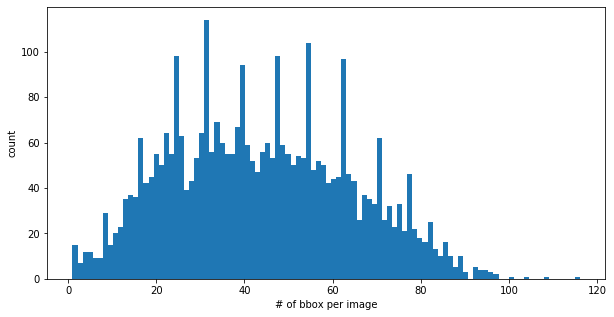

In [24]:
plt.figure(figsize=[10,5])
plt.hist(x='bbox', data=train_info_gb_imageid, bins=100)
plt.xlabel('# of bbox per image')
plt.ylabel('count')
plt.show()

# 2. Image Visualization

## 2.1 Show the images with bounding boxes

In [25]:
from PIL import Image, ImageDraw

In [26]:
# Function deal with the "bbox" column
def bbox_to_coord(s):
    l = s[1:-1].split(', ')
    return [float(l[0]), float(l[1]), float(l[2]), float(l[3])]

In [27]:
# Function given a "image_id", returns a image with bounding boxes drawn
def show_img_boxes(img_id): # img_id in str
    image_path = os.path.join(train_dir, img_id + '.jpg')
    image = Image.open(image_path)
    bboxes = [bbox_to_coord(box) for box in train_info[train_info['image_id']==img_id]['bbox']]
    for box in bboxes:
        ImageDraw.Draw(image).rectangle([box[0], box[1], box[0]+box[2], box[1]+box[3]], width=5, outline='red')
    return image

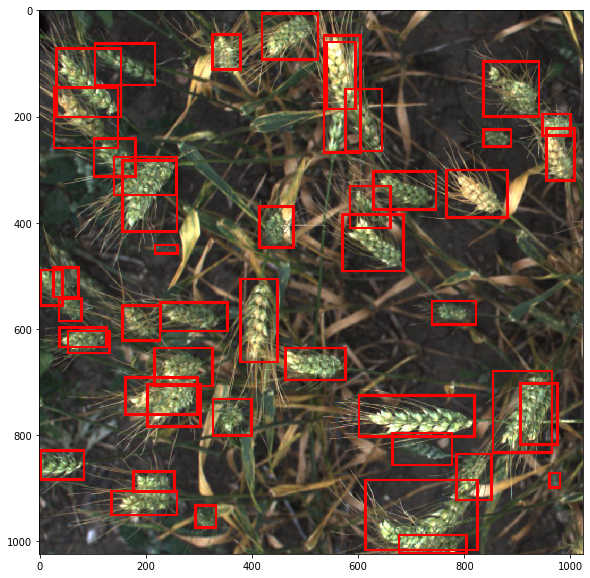

In [28]:
plt.figure(figsize=[10,10])
plt.imshow(show_img_boxes('b6ab77fd7'))
plt.show()

### - randomly picking 9 images and display with bboxes

In [29]:
image_ids = np.random.choice(train_info['image_id'].unique(), 9)

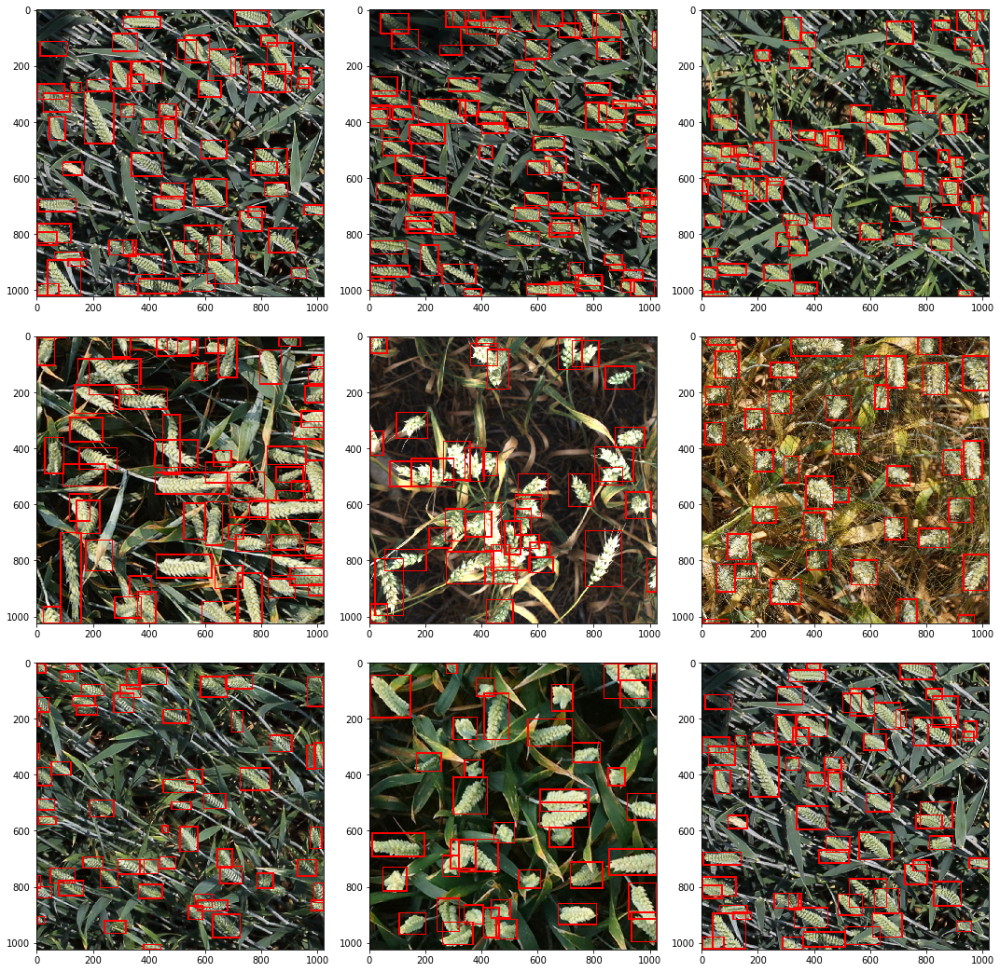

In [30]:
plt.figure(figsize=[15,15])
count=1
for img in image_ids:
    plt.subplot(3, 3, count)
    plt.imshow(show_img_boxes(img))
    plt.tight_layout()
    count+=1

## 2.2 Check for skewed bounding boxes

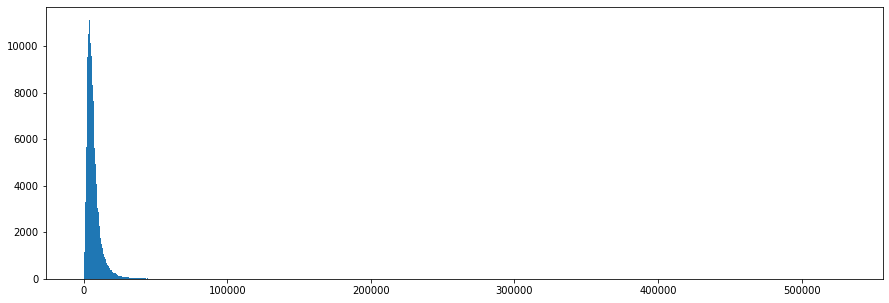

In [37]:
plt.figure(figsize=[15,5])
plt.hist(x='bbox_area', data=train_info, bins=1000)
plt.show()

In [46]:
sum(train_info['bbox_area'] >= 100000)

24

- The distribution is a little bit right skewed.
- Looks like there are 24 bounding boxes having an area greater than 100,000.

### - Randomly pick 9 from them and check what's going on.

In [51]:
image_ids = np.random.choice(train_info[train_info['bbox_area'] >= 100000]['image_id'].unique(), 9)

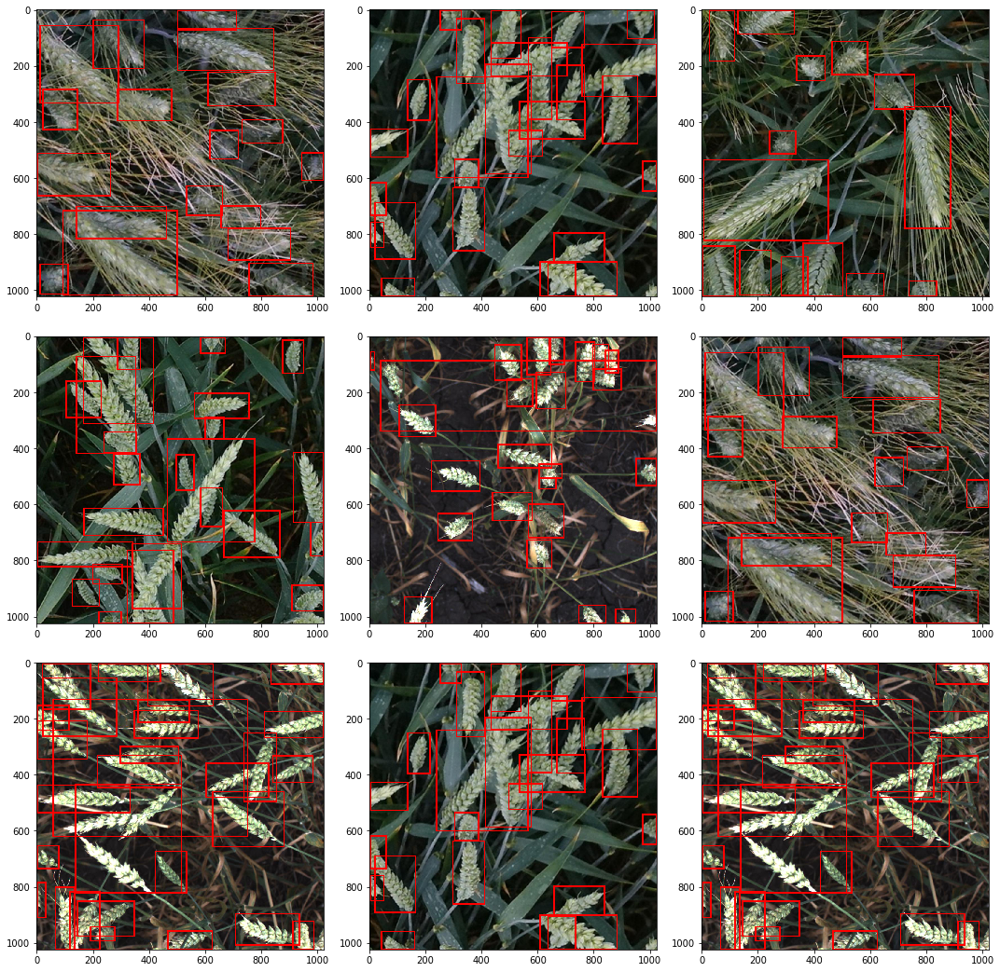

In [52]:
plt.figure(figsize=[15,15])
count=1
for img in image_ids:
    plt.subplot(3, 3, count)
    plt.imshow(show_img_boxes(img))
    plt.tight_layout()
    count+=1

- As shown above, most of the large bounding boxes are because of relatively zoomed in image or the position of the wheat head. Those are correct labelings.
- A few of large bounding boxes does not seem correct, which might just be labeling mistakes.
- Since there are not many such mistakes, we could just live them there, or get rid of them manually.

## 2.3 Different types of wheat

In [58]:
wheat_types = train_info['source'].unique()

In [63]:
wheat_types

array(['usask_1', 'arvalis_1', 'inrae_1', 'ethz_1', 'arvalis_3', 'rres_1',
       'arvalis_2'], dtype=object)

In [59]:
len(wheat_types)

7

- there are 7 types of wheat in the training set

### - distribution of wheat types in the training set

In [113]:
train_info.groupby('source')['image_id'].nunique()

source
arvalis_1    1055
arvalis_2     204
arvalis_3     559
ethz_1        747
inrae_1       176
rres_1        432
usask_1       200
Name: image_id, dtype: int64

- The number of images for different types of wheat are not very balanced.
- This can be improved when conducting __Data Augmentation__.

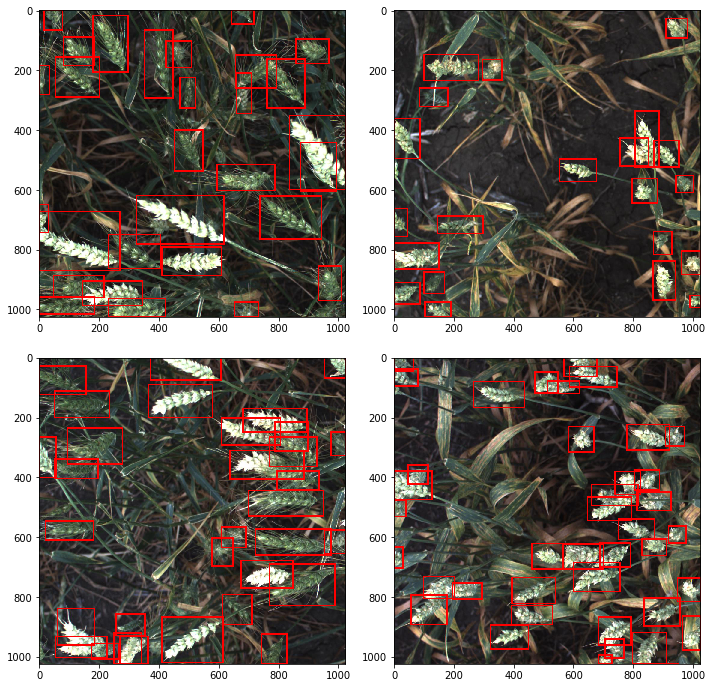

In [65]:
# wheat type == 'usask_1'
image_ids = np.random.choice(train_info[train_info['source']=='usask_1']['image_id'].unique(), 4)
plt.figure(figsize=[10,10])
count=1
for img in image_ids:
    plt.subplot(2, 2, count)
    plt.imshow(show_img_boxes(img))
    plt.tight_layout()
    count+=1

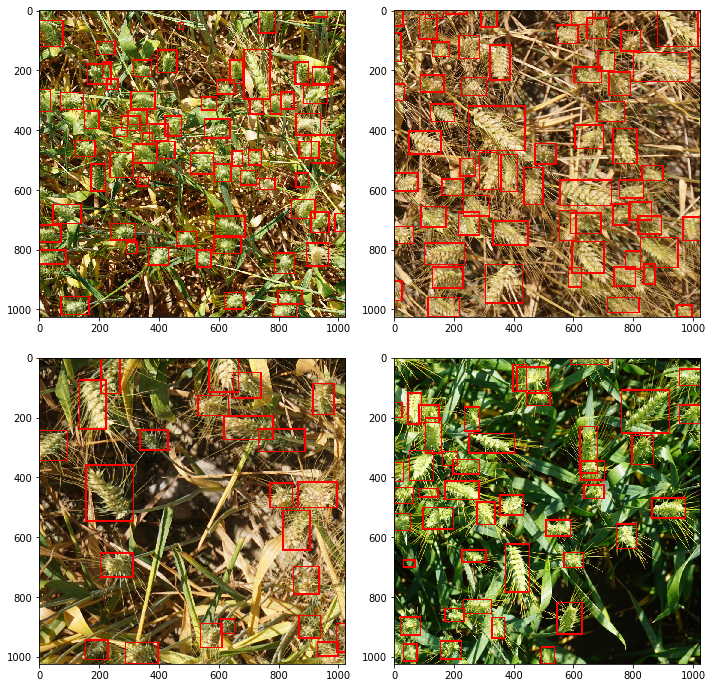

In [67]:
# wheat type == 'arvalis_1'
image_ids = np.random.choice(train_info[train_info['source']=='arvalis_1']['image_id'].unique(), 4)
plt.figure(figsize=[10,10])
count=1
for img in image_ids:
    plt.subplot(2, 2, count)
    plt.imshow(show_img_boxes(img))
    plt.tight_layout()
    count+=1

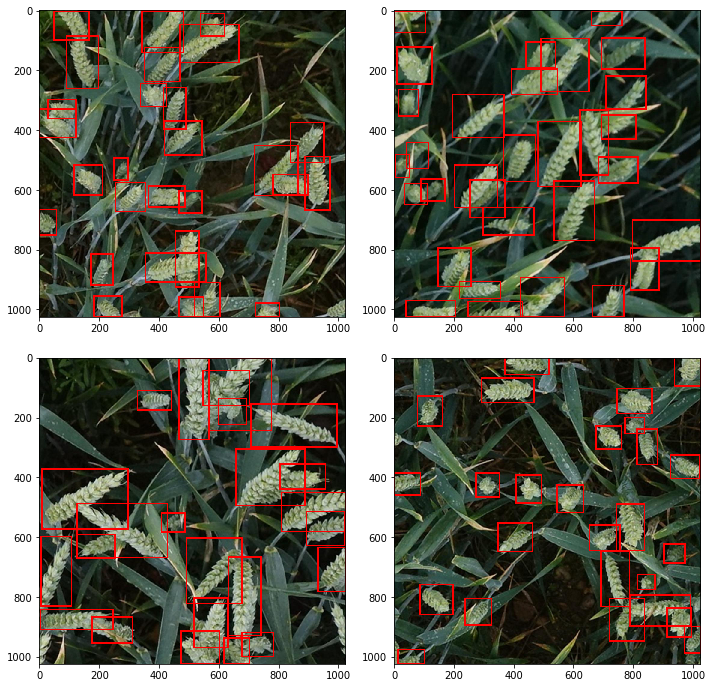

In [114]:
# wheat type == 'inrae_1'
image_ids = np.random.choice(train_info[train_info['source']=='inrae_1']['image_id'].unique(), 4)
plt.figure(figsize=[10,10])
count=1
for img in image_ids:
    plt.subplot(2, 2, count)
    plt.imshow(show_img_boxes(img))
    plt.tight_layout()
    count+=1

# 3. Visualization using TensorFlow

## 3.1 Preprocessing

In [258]:
path_to_img = os.path.join(train_dir, 'b6ab77fd7' + '.jpg')

In [259]:
def load_img(path_to_img, max_dim=1024):
    max_dim = max_dim
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, dtype=tf.float32)
    
    shape = tf.cast(tf.shape(img)[:-1], dtype=tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim
    new_shape = tf.cast(shape*scale, dtype=tf.int32)
    
    img = tf.image.resize(img, size=new_shape)
    img = img[tf.newaxis, :] # (422, 512, 3) -> (1, 422, 512, 3)
    
    return img  

In [260]:
def show_img(img, title=None):
    if len(img.shape) > 3: # for caces such as (1, 422, 512, 3)
        img = tf.squeeze(img) # Removes dimensions of size 1 from the shape of a tensor
    
    plt.imshow(img)
    if title:
        plt.title(title)

In [262]:
img = load_img(path_to_img)

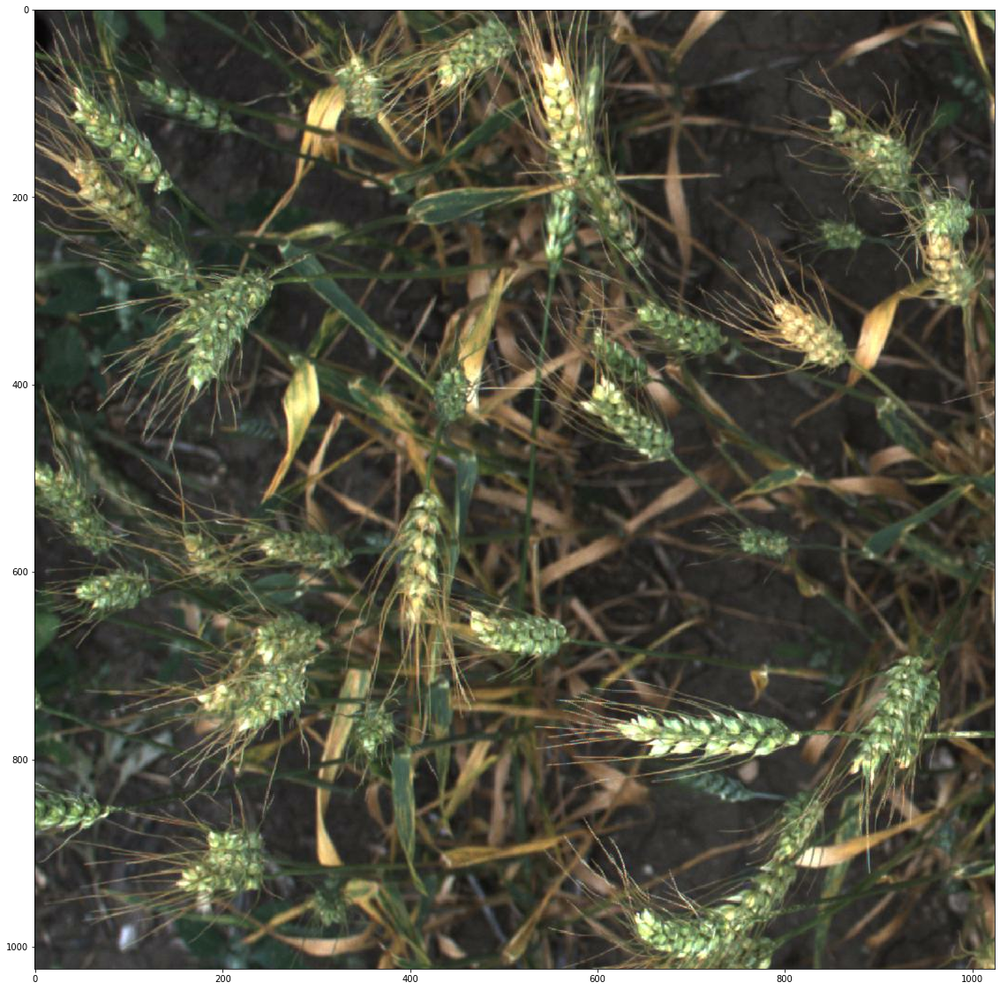

In [263]:
plt.figure(figsize=[20, 20])
show_img(img)

## 3.2 Drawing bounding boxes on images

In [264]:
# Function deal with the "bbox" column
def tf_bbox_to_coord(s, max_dim=1024):
    l = s[1:-1].split(', ')
    return [float(l[1])/max_dim, float(l[0])/max_dim, (float(l[3])+float(l[1]))/max_dim, (float(l[2])+float(l[0]))/max_dim]

In [265]:
# Function given a "image_id", returns a image with bounding boxes drawn
# using TF
def tf_show_img_boxes(img_id, max_dim=1024): # img_id in str
    image_path = os.path.join(train_dir, img_id + '.jpg')
    image = load_img(image_path, max_dim=1024)
    bboxes = [tf_bbox_to_coord(box, max_dim) for box in train_info[train_info['image_id']==img_id]['bbox']]
    boxes = np.array(bboxes)
    boxes = boxes.reshape([1, len(bboxes), 4])
    colors = np.array([[1.0, 0.0, 0.0]])
    img_boxes = tf.image.draw_bounding_boxes(images=image, boxes=boxes, colors=colors)
    return img_boxes

In [266]:
bimg = tf_show_img_boxes('b6ab77fd7', max_dim=1024)

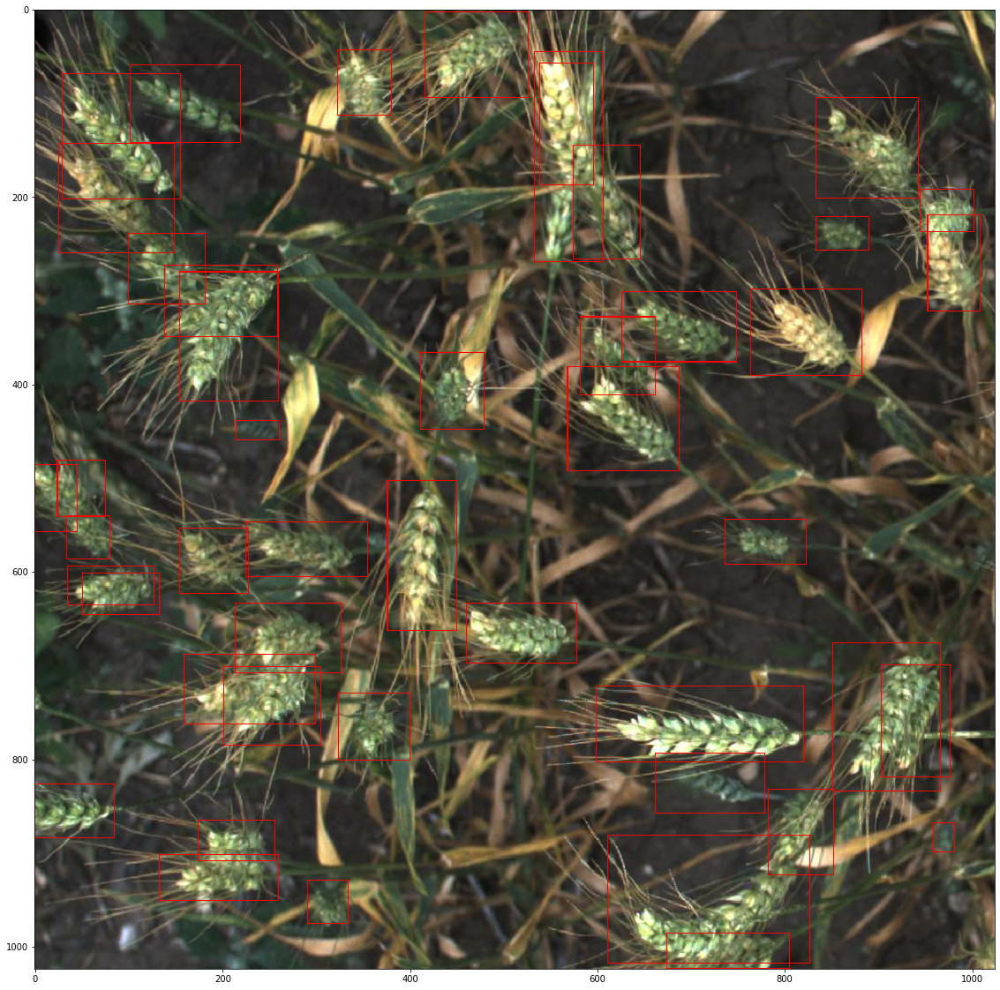

In [267]:
plt.figure(figsize=[20, 20])
show_img(bimg)